<a href="https://colab.research.google.com/github/Thandriss/telecom_labs/blob/main/Makhonko_lab1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Get thinkdsp.py

import os

if not os.path.exists('thinkdsp.py'):
    !wget https://github.com/Thandriss/ThinkDSP/raw/master/code/thinkdsp.py

--2022-02-09 17:04:32--  https://github.com/Thandriss/ThinkDSP/raw/master/code/thinkdsp.py
Resolving github.com (github.com)... 13.114.40.48
Connecting to github.com (github.com)|13.114.40.48|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/Thandriss/ThinkDSP/master/code/thinkdsp.py [following]
--2022-02-09 17:04:33--  https://raw.githubusercontent.com/Thandriss/ThinkDSP/master/code/thinkdsp.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 48687 (48K) [text/plain]
Saving to: ‘thinkdsp.py’

thinkdsp.py         100%[===================>]  47.55K  --.-KB/s    in 0.01s   

2022-02-09 17:04:33 (3.80 MB/s) - ‘thinkdsp.py’ saved [48687/48687]



Лабораторная работа №1

Студент: Махонько Яна Викторовна

Группа: 3530901/90202

Преподаватель: Богач Наталья Владимировна

## Упражнение №1.1

Для Jupiter надо загрузить chap01.ipynb, прочитать пояснения и запустить примеры.

Решение:

Задание выполнено. В коде была найдена ошибка - не доставало файла 92002__jcveliz__violin-origional.wav. Он был скачен и добавлен.



## Упражнение №1.2

In [ ]:
if not os.path.exists('365269__jalsblack__dime-la-verdad.wav'):
    !wget https://github.com/Thandriss/ThinkDSP/raw/master/code/365269__jalsblack__dime-la-verdad.wav

In [207]:
from thinkdsp import read_wave

wave = read_wave('365269__jalsblack__dime-la-verdad.wav')
wave.normalize()
wave.make_audio()

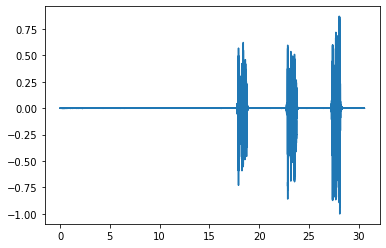

In [208]:
wave.plot()

In [209]:
segment = wave.segment(start=17, duration=2)
segment.make_audio()

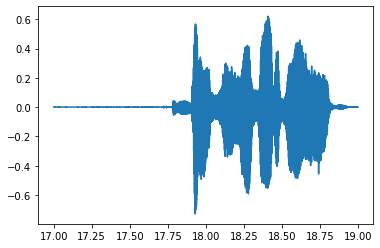

In [210]:
segment.plot()

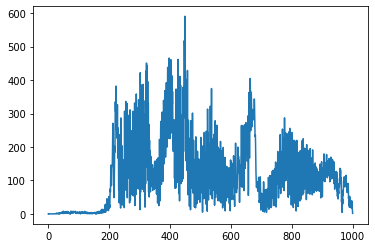

In [211]:
spectrum = segment.make_spectrum()
spectrum.plot(high=1000)

In [212]:
spectrum.peaks()[:30]

[(590.5782758620699, 449.0),
 (552.2825105187927, 449.5),
 (517.5066076541594, 446.5),
 (498.0114076123717, 447.0),
 (465.72269554475633, 397.0),
 (461.7893549708029, 426.0),
 (460.7319102338634, 402.5),
 (459.7040365217051, 448.5),
 (450.78123083290006, 322.5),
 (447.15426375412227, 396.5),
 (443.19415120068095, 324.5),
 (437.81359770408915, 392.0),
 (428.4015227131818, 457.0),
 (426.5437826077118, 320.5),
 (425.83770379539976, 392.5),
 (421.95971190331943, 302.0),
 (419.5076616981402, 402.0),
 (417.51923000490353, 425.5),
 (413.1304398227766, 391.5),
 (412.411028507955, 406.5),
 (412.2927010029628, 397.5),
 (411.01632268235807, 432.0),
 (406.59785445255415, 401.0),
 (404.7442408355169, 663.0),
 (404.4533631132222, 446.0),
 (402.0440676733942, 451.5),
 (401.6593820086327, 662.5),
 (396.3992148289623, 456.5),
 (395.56154136975874, 326.5),
 (392.5544276679808, 403.0)]

In [213]:
spectrum.low_pass(500, 0.1)
spectrum.make_wave().make_audio()

low_pass - фильтр, который ослабевает компоненты выше заданной частоты

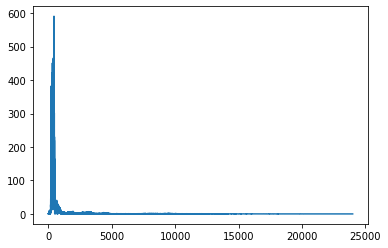

In [214]:
spectrum.plot()

In [215]:
spectrum = segment.make_spectrum()
spectrum.high_pass(300, 0.1)
spectrum.make_wave().make_audio()

high_pass - фильтр верхних частот, ослабляет частоты ниже заданной частоты

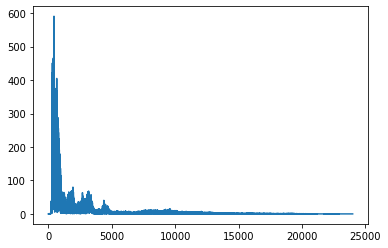

In [216]:
spectrum.plot()

In [217]:
spectrum = segment.make_spectrum()
spectrum.band_stop(500, 300)
spectrum.make_wave().make_audio()

band_stop - ослабевает частоты в промежутке двух частот

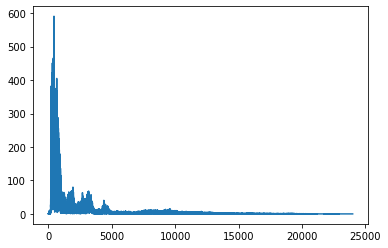

In [218]:
spectrum.plot()

In [219]:
spectrum = segment.make_spectrum()
spectrum.high_pass(300)
spectrum.low_pass(500)
spectrum.make_wave().make_audio()

В записи выше слышно, как первый фильтр вырезает низкие ноты, а второй заглушае и удаляет высокие звуки.

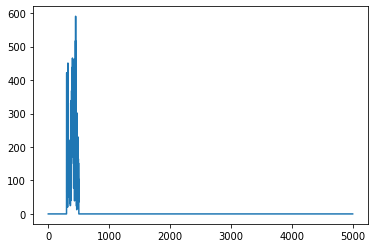

In [221]:
spectrum.plot(5000)

## Упражнение №1.3

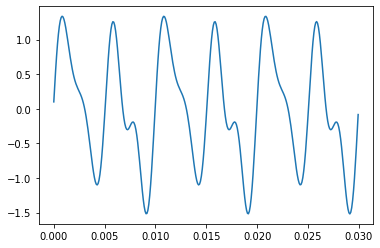

In [201]:
from thinkdsp import SinSignal
from thinkdsp import CosSignal

signal = (SinSignal(freq=200, amp=1.0) +
          SinSignal(freq=400, amp=0.5) +
          SinSignal(freq=100, amp=0.25)+
          CosSignal(freq=500, amp=0.1))
signal.plot()

In [202]:
wave2 = signal.make_wave(duration=2)
wave2.apodize()

In [203]:
wave2.make_audio()

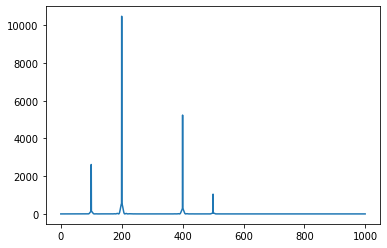

In [204]:
spectrum = wave2.make_spectrum()
spectrum.plot(high=1000)

In [205]:
signal += SinSignal(freq=450)
signal.make_wave().make_audio()

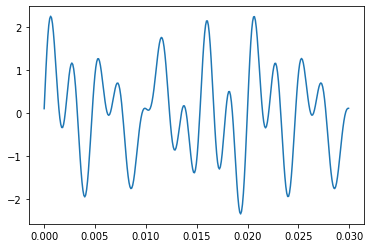

In [206]:
signal.plot()

Если добавить частоту не кратную имебщимся, то получится дрожжащий звук.

## Упражнение №1.4

In [159]:
wave3 = read_wave('365269__jalsblack__dime-la-verdad.wav')
wave3.normalize()
wave3.make_audio()

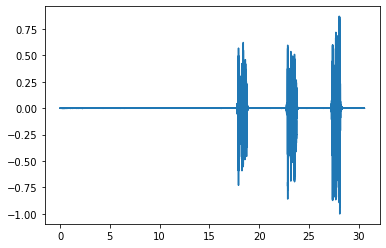

In [140]:
wave3.plot()

In [141]:
def stretch(wave, factor):
    wave.ts *= factor
    wave.framerate /= factor

factor < 1 - ускоряется запись

factor = 1 - остаётся без изменений

factor > 1 - замедляется

.ts - атрибут, который позволяет ускорить или замедлить начало сигнала

.framerate - длительность сигнала

In [160]:
stretch(wave3, 0.5)
wave3.make_audio()

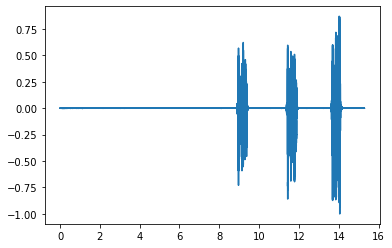

In [161]:
wave3.plot()